# Forest Over Type Prediction

## [Data Description](https://www.kaggle.com/c/forest-cover-type-prediction/data)

### Understanding our [tree cover types](https://csfs.colostate.edu/colorado-forests/forest-types/)


1 - [Spruce/Fir](https://csfs.colostate.edu/colorado-forests/forest-types/spruce-fir/): 
Very extensive in Colorado. Usually found at high elevations.   
Species is shade tolerant and tend to quickly repopulate shaded gaps in the forest.   
Very prone to fire, but it takes a very long time (300-400 years) for this type of tree to regenerate (unlike other types).   
Contribution to water supply.   

2 - [Lodgepole Pine](): 
Tolerates wide variety of soil and climate conditions, but does best in gentle slopes and well-drain, acidic, sandy, gravelling loams.    
Intolerant to shade.     
Develops post fire (seeds release under extreme heat).    

3 - [Ponderosa Pine](https://csfs.colostate.edu/colorado-trees/colorados-major-tree-species/):
1829 to 2743 meters (low elevation)    
Drough resistant and significant resource for water supply.   
At interface of wildlife and urban life.   


4 - [Cottonwood/Willow](https://csfs.colostate.edu/media/sites/22/2015/06/Cottonwood_Management_QuickGuide_26June2015.pdf)
Found at lower elevations.   
Eastern side    
Adjacent to rivers and streams.   
1066 - 1981 meters (low elevation)  
Susceptible to high-intensity fire (climate change). Does OK with low-intensity.   
Soil: sandy or silty.   

5 - [Aspen](https://csfs.colostate.edu/colorado-forests/forest-types/aspen/)
Loves sun and does well at higher temperatures.   
Open canopy allows light to reach forest floors.   
Grows well after fires.    
Dryer soils: sandy, gravelly slopes  

6 - [Douglas-fir](https://csfs.colostate.edu/colorado-trees/colorados-major-tree-species/#1466527937174-cd5c5e60-5efc) 
Shade-tolerant   
Rocky, moist soils  
Nothern slopes  
Elevation: 1829 - 2896 meters. 
Susceptible to fire when young, resistent when older.  

7 - [Krummholz](https://coloradobirdingtrail.com/birding-basics/habitats/subalpine-forest/)  
Stunted vegetation due to winds. 
Can only survived when sheltered by rock formations or snow covers  
Higher elevations, subalpine forests. 
Usually this habitat can be accessed in summer, because of snow covering during the rest of the year.  
Unlikely exposed to fire.  
Possibly thin soils.  

## Data Import

In [188]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
#from google.colab import files
import io

%matplotlib inline

In [189]:
#train_df = pd.read_csv(io.BytesIO(uploaded_train['train.csv']), index_col='Id')
train_df = pd.read_csv('input/train.csv', index_col='Id')
col_names = train_df.columns.tolist()

print("Column names:")
print(col_names)

print("\nSample data:")
train_df.head()

Column names:
['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40', 'Cover_Type']

Sample data:


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Id,,,,,,,,,,,,,,,,,,,,,
1,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
2,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
3,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
4,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
5,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [190]:
# Isolate target data
cover_type = train_df['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_df.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)

print("Feature space hold %d observations and %d features" % X.shape)
print("Unique target labels:", np.unique(y))

Feature space hold 15120 observations and 54 features
Unique target labels: [1 2 3 4 5 6 7]


In [191]:
# Assessing missingness
print("There are", np.count_nonzero(np.isnan(X)), "missing values among our features")
print("There are", np.count_nonzero(np.isnan(y)), "missing values among our target values")

#Assessing plausibility of values
print("\nLooking at summary statistics for our training data:")
train_df.describe()

There are 0 missing values among our features
There are 0 missing values among our target values

Looking at summary statistics for our training data:


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,...,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,...,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,3104.000000,261.000000,22.000000,330.000000,79.000000,2270.000000,235.000000,235.000000,167.000000,1988.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,3849.000000,360.000000,52.000000,1343.000000,554.000000,6890.000000,254.000000,254.000000,248.000000,6993.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [192]:
def replace_with_cover_type_desc(data):
    
    data['Cover_Type'].replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)
    return(data)

In [193]:
train_df = replace_with_cover_type_desc(train_df)

## Elevation

In [194]:
fig = px.histogram(train_df, x="Elevation", color="Cover_Type", title= "Distribution of Cover Types")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

## [Soils](https://soilseries.sc.egov.usda.gov/osdname.aspx)

Soil is made of sand, silt, clay and organic matter.  

In [195]:
def add_soil_type(data):
    data['Soil_Type'] = (data.iloc[:,15:55] == 1).idxmax(1)
    data['Soil_Name'] = data['Soil_Type'].replace({'Soil_Type1':'Cathedral', 
                                                             'Soil_Type2': 'Vanet', 
                                                             'Soil_Type3': 'Haploborolis', 
                                                             'Soil_Type4': 'Ratake', 
                                                             'Soil_Type5': 'Vanet', 
                                                             'Soil_Type6': "Vanet Wetmore",
                                                             'Soil_Type7': 'Gothic', 
                                                             'Soil_Type8': 'Supervisor',
                                                             'Soil_Type9': 'Troutville',
                                                             'Soil_Type10': 'Bullwark Catamount',
                                                             'Soil_Type11': 'Bullwark Catamount',
                                                             'Soil_Type12': 'Legault',
                                                             'Soil_Type13': 'Bullwark Catamount',
                                                             'Soil_Type14': 'Pacic Argiborolis',
                                                             'Soil_Type15': 'Unspecified',
                                                             'Soil_Type16': 'Cryaquolis',
                                                             'Soil_Type17': 'Gateview family', 
                                                             'Soil_Type18': 'Rogert family',
                                                             'Soil_Type19': 'Typic Cryaquolis',
                                                             'Soil_Type20': 'Typic Cryaquepts',
                                                             'Soil_Type21': 'Typic Cryaquolls - Leighcan family',
                                                             'Soil_Type22': 'Leighcan family bouldery',
                                                             'Soil_Type23': 'Typic Cryaquolls - Leighcan family',
                                                             'Soil_Type24': 'Leighcan family stony',
                                                             'Soil_Type25': 'Leighcan family stony warm',
                                                             'Soil_Type26': 'Granile',
                                                             'Soil_Type27': 'Leighcan family stony warm',
                                                             'Soil_Type28': 'Leighcan family outcrop stony',
                                                             'Soil_Type29': 'Como',
                                                             'Soil_Type30': 'Como- Rock land',
                                                             'Soil_Type31': 'Leighcan - Catamount families',
                                                             'Soil_Type32': 'Leighcan - Catamount families',
                                                             'Soil_Type33': 'Leighcan - Catamount families',
                                                             'Soil_Type34': 'Cryorthents - Cryaquepts complex',
                                                             'Soil_Type35': 'Cryumbrepts',
                                                             'Soil_Type36': 'Bross family',
                                                             'Soil_Type37': 'Cryumbrepts - Cryorthents complex',
                                                             'Soil_Type38': 'Leighcan - Moran families',
                                                             'Soil_Type39': 'Moran family - Cryorthents',
                                                             'Soil_Type40': 'Moran family - Cryorthents - Rock land complex'}                                                         
                                                            , inplace=False)


    return(data)



In [196]:
train_df = add_soil_type(train_df)

In [197]:
fig = px.histogram(train_df, x="Soil_Type", color="Cover_Type", title='Distribution of the Soil Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [198]:
fig = px.histogram(train_df, x="Soil_Name", color="Cover_Type", title='Distribution of the Soil Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [199]:
def add_soil_family(data):
    data['Soil_Family'] = data['Soil_Type'].replace({'Soil_Type1':'Cathedral',
                                                            'Soil_Type2':'Vanet-Ratake',
                                                            'Soil_Type3':'Haploborolis',
                                                            'Soil_Type4':'Ratake',
                                                            'Soil_Type5':'Vanet',
                                                            'Soil_Type6':'Vanet-Wetmore ',
                                                            'Soil_Type7':'Gothic',
                                                            'Soil_Type8':'Supervisor-Limber',
                                                            'Soil_Type9':'Troutville',
                                                            'Soil_Type10':'Bullwark Catamount families',
                                                            'Soil_Type11':'Bullwark Catamount families',
                                                            'Soil_Type12':'Legault family',
                                                            'Soil_Type13':'Catamount Bullwark',
                                                            'Soil_Type14':'Pachic Argiborolis',
                                                            'Soil_Type15':'Soil_Type15',
                                                            'Soil_Type16':'Cryaquolis-Cryoborolis',
                                                            'Soil_Type17':'Gateview',
                                                            'Soil_Type18':'Rogert family',
                                                            'Soil_Type19':'Typic Cryaquolis-Borohemists',
                                                            'Soil_Type20':'Typic Cryaquepts-Typic Cryaquolls',
                                                            'Soil_Type21':'Leighcan family',
                                                            'Soil_Type22':'Leighcan family',
                                                            'Soil_Type23':'Leighcan family',
                                                            'Soil_Type24':'Leighcan family',
                                                            'Soil_Type25':'Leighcan family',
                                                            'Soil_Type26':'Catamount Granile ',
                                                            'Soil_Type27':'Leighcan family',
                                                            'Soil_Type28':'Leighcan family',
                                                            'Soil_Type29':'Como Legault',
                                                            'Soil_Type30':'Como Legault',
                                                            'Soil_Type31':'Leighcan Catamount',
                                                            'Soil_Type32':'Leighcan Catamount',
                                                            'Soil_Type33':'Leighcan Catamount',
                                                            'Soil_Type34':'Cryorthents',
                                                            'Soil_Type35':'Cryumbrepts Cryaquepts',
                                                            'Soil_Type36':'Bross ',
                                                            'Soil_Type37':'Cryumbrepts Cryorthents',
                                                            'Soil_Type38':'Leighcan Moran',
                                                            'Soil_Type39':'Leighcan Moran',
                                                            'Soil_Type40':'Moran'}                                                         
                                                            , inplace=False)
    return(data)

In [200]:
train_df = add_soil_family(train_df)

In [201]:
fig = px.histogram(train_df, x="Soil_Family", color="Cover_Type", title='Distribution of the Soil Families by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [202]:
def add_Soil_Complex(data):
    
    data['Soil_Complex'] = data['Soil_Type'].replace({'Soil_Type1':'Rock outcrop',
                                                                'Soil_Type2':'Unspecified',
                                                                'Soil_Type3':'Rock outcrop',
                                                                'Soil_Type4':'Rock outcrop',
                                                                'Soil_Type5':'Rock outcrop',
                                                                'Soil_Type6':'Rock outcrop',
                                                                'Soil_Type7':'Unspecified',
                                                                'Soil_Type8':'Unspecified',
                                                                'Soil_Type9':'Unspecified',
                                                                'Soil_Type10':'Rock outcrop',
                                                                'Soil_Type11':'Rock land',
                                                                'Soil_Type12':'Rock land',
                                                                'Soil_Type13':'Rock land',
                                                                'Soil_Type14':'Aquolis',
                                                                'Soil_Type15':'Unspecified',
                                                                'Soil_Type16':'Cryaquolis-Cryoborolis',
                                                                'Soil_Type17':'Cryaquolis',
                                                                'Soil_Type18':'Unspecified',
                                                                'Soil_Type19':'Typic Cryaquolis-Borohemists',
                                                                'Soil_Type20':'Typic Cryaquepts-Typic Cryaquolis',
                                                                'Soil_Type21':'Typic Cryaquolis till substratum',
                                                                'Soil_Type22':'Unspecified',
                                                                'Soil_Type23':'Typic Cryaquolis',
                                                                'Soil_Type24':'Unspecified',
                                                                'Soil_Type25':'Unspecified',
                                                                'Soil_Type26':'Unspecified',
                                                                'Soil_Type27':'Rock outcrop',
                                                                'Soil_Type28':'Rock outcrop',
                                                                'Soil_Type29':'Unspecified',
                                                                'Soil_Type30':'Rock land',
                                                                'Soil_Type31':'Unspecified',
                                                                'Soil_Type32':'Rock outcrop',
                                                                'Soil_Type33':'Rock outcrop',
                                                                'Soil_Type34':'Rock land',
                                                                'Soil_Type35':'Rock outcrop',
                                                                'Soil_Type36':'Cryumbrepts  Rock land',
                                                                'Soil_Type37':'Rock outcrop',
                                                                'Soil_Type38':'Cryaquolis',
                                                                'Soil_Type39':'Cryorthents',
                                                                'Soil_Type40':'Cryorthents Rock land '} , inplace=False)
    return(data)
                                                         

In [203]:
train_df = add_Soil_Complex(train_df)

In [204]:
fig = px.histogram(train_df, x="Soil_Complex", color="Cover_Type", title='Distribution of the Soil Complexes by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [205]:
def add_Soil_depth(data):
    
    data['Soil_Depth'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                            'Soil_Type2':'0',
                                                            'Soil_Type3':'-1',
                                                            'Soil_Type4':'0',
                                                            'Soil_Type5':'0',
                                                            'Soil_Type6':'0',
                                                            'Soil_Type7':'2',
                                                            'Soil_Type8':'1',
                                                            'Soil_Type9':'2',
                                                            'Soil_Type10':'1',
                                                            'Soil_Type11':'1',
                                                            'Soil_Type12':'0',
                                                            'Soil_Type13':'1',
                                                            'Soil_Type14':'-1',
                                                            'Soil_Type15':'-1',
                                                            'Soil_Type16':'-1',
                                                            'Soil_Type17':'2',
                                                            'Soil_Type18':'0',
                                                            'Soil_Type19':'-1',
                                                            'Soil_Type20':'-1',
                                                            'Soil_Type21':'2',
                                                            'Soil_Type22':'2',
                                                            'Soil_Type23':'2',
                                                            'Soil_Type24':'2',
                                                            'Soil_Type25':'2',
                                                            'Soil_Type26':'1',
                                                            'Soil_Type27':'2',
                                                            'Soil_Type28':'2',
                                                            'Soil_Type29':'1',
                                                            'Soil_Type30':'2',
                                                            'Soil_Type31':'2',
                                                            'Soil_Type32':'1',
                                                            'Soil_Type33':'1',
                                                            'Soil_Type34':'-1',
                                                            'Soil_Type35':'-1',
                                                            'Soil_Type36':'2',
                                                            'Soil_Type37':'-1',
                                                            'Soil_Type38':'2',
                                                            'Soil_Type39':'2',
                                                            'Soil_Type40':'2',} , inplace=False)
    return(data)

In [206]:
train_df = add_Soil_depth(train_df)

In [207]:
fig = px.histogram(train_df, x="Soil_Depth", color="Cover_Type", title='Distribution of the Soil Depths by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [208]:
def add_Soil_Stony(data):
    
    data['Soil_Stony'] = data['Soil_Type'].replace({'Soil_Type1':'3',
                                                            'Soil_Type2':'2',
                                                            'Soil_Type3':'0',
                                                            'Soil_Type4':'0',
                                                            'Soil_Type5':'0',
                                                            'Soil_Type6':'1',
                                                            'Soil_Type7':'0',
                                                            'Soil_Type8':'0',
                                                            'Soil_Type9':'2',
                                                            'Soil_Type10':'0',
                                                            'Soil_Type11':'0',
                                                            'Soil_Type12':'1',
                                                            'Soil_Type13':'0',
                                                            'Soil_Type14':'0',
                                                            'Soil_Type15':'0',
                                                            'Soil_Type16':'0',
                                                            'Soil_Type17':'0',
                                                            'Soil_Type18':'2',
                                                            'Soil_Type19':'0',
                                                            'Soil_Type20':'0',
                                                            'Soil_Type21':'0',
                                                            'Soil_Type22':'0',
                                                            'Soil_Type23':'0',
                                                            'Soil_Type24':'3',
                                                            'Soil_Type25':'3',
                                                            'Soil_Type26':'2',
                                                            'Soil_Type27':'3',
                                                            'Soil_Type28':'3',
                                                            'Soil_Type29':'3',
                                                            'Soil_Type30':'3',
                                                            'Soil_Type31':'3',
                                                            'Soil_Type32':'3',
                                                            'Soil_Type33':'3',
                                                            'Soil_Type34':'3',
                                                            'Soil_Type35':'0',
                                                            'Soil_Type36':'3',
                                                            'Soil_Type37':'3',
                                                            'Soil_Type38':'3',
                                                            'Soil_Type39':'3',
                                                            'Soil_Type40':'3'} , inplace=False)
    return(data)

In [209]:
train_df = add_Soil_Stony(train_df)

In [210]:
fig = px.histogram(train_df, x="Soil_Stony", color="Cover_Type", title='Distribution of the Soil Stone Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [211]:
def add_Soil_Rubbly(data):
    
    data['Soil_Rubbly'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                        'Soil_Type2':'0',
                                                        'Soil_Type3':'1',
                                                        'Soil_Type4':'1',
                                                        'Soil_Type5':'1',
                                                        'Soil_Type6':'0',
                                                        'Soil_Type7':'0',
                                                        'Soil_Type8':'0',
                                                        'Soil_Type9':'0',
                                                        'Soil_Type10':'1',
                                                        'Soil_Type11':'1',
                                                        'Soil_Type12':'0',
                                                        'Soil_Type13':'1',
                                                        'Soil_Type14':'0',
                                                        'Soil_Type15':'0',
                                                        'Soil_Type16':'0',
                                                        'Soil_Type17':'0',
                                                        'Soil_Type18':'0',
                                                        'Soil_Type19':'0',
                                                        'Soil_Type20':'0',
                                                        'Soil_Type21':'0',
                                                        'Soil_Type22':'0',
                                                        'Soil_Type23':'0',
                                                        'Soil_Type24':'0',
                                                        'Soil_Type25':'0',
                                                        'Soil_Type26':'0',
                                                        'Soil_Type27':'0',
                                                        'Soil_Type28':'0',
                                                        'Soil_Type29':'0',
                                                        'Soil_Type30':'0',
                                                        'Soil_Type31':'0',
                                                        'Soil_Type32':'0',
                                                        'Soil_Type33':'0',
                                                        'Soil_Type34':'0',
                                                        'Soil_Type35':'0',
                                                        'Soil_Type36':'0',
                                                        'Soil_Type37':'0',
                                                        'Soil_Type38':'0',
                                                        'Soil_Type39':'0',
                                                        'Soil_Type40':'0'} , inplace=False)
    return(data)


In [212]:
train_df = add_Soil_Rubbly(train_df)

In [213]:
fig = px.histogram(train_df, x="Soil_Rubbly", color="Cover_Type", title='Distribution of the Soil Rubble Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [214]:
def add_Soil_Bouldery(data):
    
    data['Soil_Bouldery'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                                'Soil_Type2':'0',
                                                                'Soil_Type3':'0',
                                                                'Soil_Type4':'0',
                                                                'Soil_Type5':'0',
                                                                'Soil_Type6':'0',
                                                                'Soil_Type7':'0',
                                                                'Soil_Type8':'0',
                                                                'Soil_Type9':'0',
                                                                'Soil_Type10':'0',
                                                                'Soil_Type11':'0',
                                                                'Soil_Type12':'0',
                                                                'Soil_Type13':'0',
                                                                'Soil_Type14':'0',
                                                                'Soil_Type15':'0',
                                                                'Soil_Type16':'0',
                                                                'Soil_Type17':'0',
                                                                'Soil_Type18':'0',
                                                                'Soil_Type19':'0',
                                                                'Soil_Type20':'0',
                                                                'Soil_Type21':'0',
                                                                'Soil_Type22':'1',
                                                                'Soil_Type23':'0',
                                                                'Soil_Type24':'0',
                                                                'Soil_Type25':'0',
                                                                'Soil_Type26':'0',
                                                                'Soil_Type27':'0',
                                                                'Soil_Type28':'0',
                                                                'Soil_Type29':'0',
                                                                'Soil_Type30':'0',
                                                                'Soil_Type31':'0',
                                                                'Soil_Type32':'0',
                                                                'Soil_Type33':'0',
                                                                'Soil_Type34':'0',
                                                                'Soil_Type35':'0',
                                                                'Soil_Type36':'0',
                                                                'Soil_Type37':'0',
                                                                'Soil_Type38':'0',
                                                                'Soil_Type39':'0',
                                                                'Soil_Type40':'0'} , inplace=False)
    return(data)

In [215]:
train_df = add_Soil_Bouldery(train_df)

In [216]:
fig = px.histogram(train_df, x="Soil_Bouldery", color="Cover_Type", title='Distribution of the Soil Boulder Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [217]:
def add_Soil_Freezing(data):
    
    data['Soil_Freezing'] = data['Soil_Type'].replace({'Soil_Type1':'0',
                                                                'Soil_Type2':'0',
                                                                'Soil_Type3':'0',
                                                                'Soil_Type4':'0',
                                                                'Soil_Type5':'0',
                                                                'Soil_Type6':'0',
                                                                'Soil_Type7':'0',
                                                                'Soil_Type8':'0',
                                                                'Soil_Type9':'0',
                                                                'Soil_Type10':'0',
                                                                'Soil_Type11':'0',
                                                                'Soil_Type12':'0',
                                                                'Soil_Type13':'0',
                                                                'Soil_Type14':'0',
                                                                'Soil_Type15':'0',
                                                                'Soil_Type16':'1',
                                                                'Soil_Type17':'1',
                                                                'Soil_Type18':'0',
                                                                'Soil_Type19':'1',
                                                                'Soil_Type20':'1',
                                                                'Soil_Type21':'1',
                                                                'Soil_Type22':'0',
                                                                'Soil_Type23':'1',
                                                                'Soil_Type24':'0',
                                                                'Soil_Type25':'0',
                                                                'Soil_Type26':'0',
                                                                'Soil_Type27':'0',
                                                                'Soil_Type28':'0',
                                                                'Soil_Type29':'0',
                                                                'Soil_Type30':'0',
                                                                'Soil_Type31':'0',
                                                                'Soil_Type32':'0',
                                                                'Soil_Type33':'0',
                                                                'Soil_Type34':'0',
                                                                'Soil_Type35':'0',
                                                                'Soil_Type36':'1',
                                                                'Soil_Type37':'0',
                                                                'Soil_Type38':'1',
                                                                'Soil_Type39':'1',
                                                                'Soil_Type40':'1'} , inplace=False)
    return(data)

In [218]:
train_df = add_Soil_Freezing(train_df)

In [219]:
fig = px.histogram(train_df, x="Soil_Freezing", color="Cover_Type", title='Distribution of the Soil Freeze Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [220]:
def add_Soil_Drainage (data):
    
    data['Soil_Drainage'] = data['Soil_Type'].replace({'Soil_Type1':'3',
                                                            'Soil_Type2':'2',
                                                            'Soil_Type3':'-1',
                                                            'Soil_Type4':'2',
                                                            'Soil_Type5':'2',
                                                            'Soil_Type6':'2',
                                                            'Soil_Type7':'2',
                                                            'Soil_Type8':'2',
                                                            'Soil_Type9':'2',
                                                            'Soil_Type10':'3',
                                                            'Soil_Type11':'3',
                                                            'Soil_Type12':'3',
                                                            'Soil_Type13':'3',
                                                            'Soil_Type14':'-1',
                                                            'Soil_Type15':'-1',
                                                            'Soil_Type16':'-1',
                                                            'Soil_Type17':'3',
                                                            'Soil_Type18':'2',
                                                            'Soil_Type19':'-1',
                                                            'Soil_Type20':'-1',
                                                            'Soil_Type21':'3',
                                                            'Soil_Type22':'2',
                                                            'Soil_Type23':'2',
                                                            'Soil_Type24':'2',
                                                            'Soil_Type25':'2',
                                                            'Soil_Type26':'2',
                                                            'Soil_Type27':'2',
                                                            'Soil_Type28':'2',
                                                            'Soil_Type29':'3',
                                                            'Soil_Type30':'3',
                                                            'Soil_Type31':'2',
                                                            'Soil_Type32':'3',
                                                            'Soil_Type33':'3',
                                                            'Soil_Type34':'-1',
                                                            'Soil_Type35':'-1',
                                                            'Soil_Type36':'2',
                                                            'Soil_Type37':'-1',
                                                            'Soil_Type38':'2',
                                                            'Soil_Type39':'2',
                                                            'Soil_Type40':'2'} , inplace=False)
    return(data)


In [221]:
train_df = add_Soil_Drainage(train_df)

In [222]:
fig = px.histogram(train_df, x="Soil_Drainage", color="Cover_Type", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [223]:
def add_Soil_Annual_Temp_Range (data):
    
    data['Soil_Annual_Temp_Range'] = data['Soil_Type'].replace({'Soil_Type1':40,
                                                                        'Soil_Type2':40,
                                                                        'Soil_Type3':-1,
                                                                        'Soil_Type4':40,
                                                                        'Soil_Type5':40,
                                                                        'Soil_Type6':40,
                                                                        'Soil_Type7':30,
                                                                        'Soil_Type8':40,
                                                                        'Soil_Type9':30,
                                                                        'Soil_Type10':40,
                                                                        'Soil_Type11':40,
                                                                        'Soil_Type12':40,
                                                                        'Soil_Type13':40,
                                                                        'Soil_Type14':-1,
                                                                        'Soil_Type15':-1,
                                                                        'Soil_Type16':-1,
                                                                        'Soil_Type17':30,
                                                                        'Soil_Type18':30,
                                                                        'Soil_Type19':-1,
                                                                        'Soil_Type20':-1,
                                                                        'Soil_Type21':30,
                                                                        'Soil_Type22':30,
                                                                        'Soil_Type23':30,
                                                                        'Soil_Type24':30,
                                                                        'Soil_Type25':30,
                                                                        'Soil_Type26':30,
                                                                        'Soil_Type27':30,
                                                                        'Soil_Type28':30,
                                                                        'Soil_Type29':30,
                                                                        'Soil_Type30':30,
                                                                        'Soil_Type31':30,
                                                                        'Soil_Type32':30,
                                                                        'Soil_Type33':30,
                                                                        'Soil_Type34':-1,
                                                                        'Soil_Type35':-1,
                                                                        'Soil_Type36':20,
                                                                        'Soil_Type37':-1,
                                                                        'Soil_Type38':30,
                                                                        'Soil_Type39':30,
                                                                        'Soil_Type40':30} , inplace=False)
    return(data)

In [224]:
train_df = add_Soil_Annual_Temp_Range(train_df)

In [225]:
fig = px.histogram(train_df, x="Soil_Annual_Temp_Range", color="Cover_Type", title='Distribution of the Soil Annual Temperature Range by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

#### Elevation and Soil

In [226]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Family", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [227]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Complex", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [228]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Depth", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [229]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Drainage", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [230]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Stony", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [231]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Rubbly", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [232]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Bouldery", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [233]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Freezing", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [234]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Annual_Temp_Range", y="Elevation")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

#### Slope and Soil

In [235]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Family", y="Slope")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [236]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Rubbly", y="Slope")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [237]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Annual_Temp_Range", y="Slope")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

#### Aspect and Soil

In [238]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Family", y="Aspect")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [239]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Complex", y="Aspect")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [240]:
df = px.data.tips()
fig = px.box(train_df, x="Soil_Annual_Temp_Range", y="Aspect")
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

### Hillshade

In [241]:
def light_binary(row):
    if (row['Hillshade_9am'] >150) &  (row['Hillshade_Noon'] >150) & (row['Hillshade_3pm'] >150):
        return 1
    return 0

In [242]:
def add_light(data):
    data['Light'] = data.apply(lambda row: light_binary(row), axis=1)
    return(data)

In [243]:
train_df = add_light(train_df)

In [244]:
train_df['Light'].value_counts()

0    9996
1    5124
Name: Light, dtype: int64

In [245]:
fig = px.histogram(train_df, x="Light", color="Cover_Type", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

### Wilderness

In [246]:
def rename_wilderness_area(data):
    data = data.rename(columns={"Wilderness_Area1":"Rawah_WA","Wilderness_Area2":"Neota_WA",
    "Wilderness_Area3":"Comanche_Peak_WA","Wilderness_Area4":"Cache_la_Poudre_WA"})

    data['Wilderness_Areas'] = (data.iloc[:,10:14] == 1).idxmax(1)
    return(data)

In [247]:
train_df = rename_wilderness_area(train_df)

In [248]:


fig = px.histogram(train_df, x="Elevation", color="Wilderness_Areas", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [249]:
fig = px.histogram(train_df, x="Slope", color="Wilderness_Areas", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

In [250]:
fig = px.histogram(train_df, x="Aspect", color="Wilderness_Areas", title='Distribution of the Soil Drain Types by Cover Types')
fig.update_layout({
'plot_bgcolor': 'rgba(0, 0, 0, 0)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})
fig.show()

## Additional Features

In [251]:
def add_more_features(data):   
    data['Ele_minus_VDtHyd'] = data.Elevation-data.Vertical_Distance_To_Hydrology
    data['Ele_plus_VDtHyd'] = data.Elevation+data.Vertical_Distance_To_Hydrology
    data['Distance_to_Hydrology'] = (data['Horizontal_Distance_To_Hydrology']**2+data['Vertical_Distance_To_Hydrology']**2)**0.5
    data['Hydro_plus_Fire'] = data['Horizontal_Distance_To_Hydrology']+data['Horizontal_Distance_To_Fire_Points']
    data['Hydro_minus_Fire'] = data['Horizontal_Distance_To_Hydrology']-data['Horizontal_Distance_To_Fire_Points']
    data['Hydro_plus_Road'] = data['Horizontal_Distance_To_Hydrology']+data['Horizontal_Distance_To_Roadways']
    data['Hydro_minus_Road'] = data['Horizontal_Distance_To_Hydrology']-data['Horizontal_Distance_To_Roadways']
    data['Fire_plus_Road'] = data['Horizontal_Distance_To_Fire_Points']+data['Horizontal_Distance_To_Roadways']
    data['Fire_minus_Road'] = data['Horizontal_Distance_To_Fire_Points']-data['Horizontal_Distance_To_Roadways']
    data['Soil_Type_agg'] = (data.iloc[:,15:55] == 1).idxmax(1).str.extract('(\D+)(\d+)', expand=False)[1]
    return data

In [252]:
train_df = add_more_features(train_df)

In [253]:
train_df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
       'Comanche_Peak_WA', 'Cache_la_Poudre_WA', 'Soil_Type1', 'Soil_Type2',
       'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
       'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40',
       'Cover_Type

## Enhanced Dataset

In [254]:
def prepare_for_ML_Program(data, test=False):

    if test:
        data_new = data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
               'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
               'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
               'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
               'Comanche_Peak_WA', 'Cache_la_Poudre_WA',
               'Soil_Depth', 'Soil_Stony', 'Soil_Rubbly', 'Soil_Bouldery',
               'Soil_Freezing','Soil_Drainage', 'Soil_Annual_Temp_Range',
               'Light', 'Ele_minus_VDtHyd', 'Ele_plus_VDtHyd',
               'Distance_to_Hydrology', 'Hydro_plus_Fire', 'Hydro_minus_Fire',
               'Hydro_plus_Road', 'Hydro_minus_Road', 'Fire_plus_Road',
               'Fire_minus_Road', 'Soil_Type1', 'Soil_Type2',
               'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
               'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
               'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
               'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
               'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
               'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
               'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
               'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
               'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]
    
    else:
        data_new = data[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
               'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
               'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
               'Horizontal_Distance_To_Fire_Points', 'Rawah_WA', 'Neota_WA',
               'Comanche_Peak_WA', 'Cache_la_Poudre_WA',
               'Soil_Depth', 'Soil_Stony', 'Soil_Rubbly', 'Soil_Bouldery',
               'Soil_Freezing','Soil_Drainage', 'Soil_Annual_Temp_Range',
               'Light', 'Ele_minus_VDtHyd', 'Ele_plus_VDtHyd',
               'Distance_to_Hydrology', 'Hydro_plus_Fire', 'Hydro_minus_Fire',
               'Hydro_plus_Road', 'Hydro_minus_Road', 'Fire_plus_Road',
               'Fire_minus_Road', 'Soil_Type1', 'Soil_Type2',
               'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7',
               'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
               'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
               'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
               'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
               'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
               'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
               'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
               'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40','Cover_Type']]
        
    dummy = pd.get_dummies(data['Soil_Family'])
    data_new = pd.concat([data_new, dummy], axis =1)
    dummy = pd.get_dummies(data['Soil_Complex'])
    data_new = pd.concat([data_new, dummy], axis =1)
    return(data_new)

In [255]:
train_new = prepare_for_ML_Program(train_df)
train_new.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points',
       ...
       'Cryorthents', 'Cryorthents Rock land ', 'Cryumbrepts  Rock land',
       'Rock land', 'Rock outcrop', 'Typic Cryaquepts-Typic Cryaquolis',
       'Typic Cryaquolis', 'Typic Cryaquolis till substratum',
       'Typic Cryaquolis-Borohemists', 'Unspecified'],
      dtype='object', length=111)

In [56]:
list(train_new.columns)

['Elevation',
 'Aspect',
 'Slope',
 'Horizontal_Distance_To_Hydrology',
 'Vertical_Distance_To_Hydrology',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Hillshade_Noon',
 'Hillshade_3pm',
 'Horizontal_Distance_To_Fire_Points',
 'Rawah_WA',
 'Neota_WA',
 'Comanche_Peak_WA',
 'Cache_la_Poudre_WA',
 'Soil_Depth',
 'Soil_Stony',
 'Soil_Rubbly',
 'Soil_Bouldery',
 'Soil_Freezing',
 'Soil_Drainage',
 'Soil_Annual_Temp_Range',
 'Light',
 'Ele_minus_VDtHyd',
 'Ele_plus_VDtHyd',
 'Distance_to_Hydrology',
 'Hydro_plus_Fire',
 'Hydro_minus_Fire',
 'Hydro_plus_Road',
 'Hydro_minus_Road',
 'Fire_plus_Road',
 'Fire_minus_Road',
 'Soil_Type1',
 'Soil_Type2',
 'Soil_Type3',
 'Soil_Type4',
 'Soil_Type5',
 'Soil_Type6',
 'Soil_Type7',
 'Soil_Type8',
 'Soil_Type9',
 'Soil_Type10',
 'Soil_Type11',
 'Soil_Type12',
 'Soil_Type13',
 'Soil_Type14',
 'Soil_Type15',
 'Soil_Type16',
 'Soil_Type17',
 'Soil_Type18',
 'Soil_Type19',
 'Soil_Type20',
 'Soil_Type21',
 'Soil_Type22',
 'Soil_Type23',
 'Soil_Ty

## Baseline Model

In [57]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [58]:
train_old = pd.read_csv('input/train.csv', index_col='Id')
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_old.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)

print("Feature space hold %d observations and %d features" % X.shape)
print("Unique target labels:", np.unique(y))

def ml_pipleline(ml_name, model, binarize = False,    detailedCVcharts = False):

    label_classes=[1,2,3,4,5,6,7]
    y_binarized = label_binarize(y,classes=[1,2,3,4,5,6,7])
    
    X_train, X_valid, y_train, y_valid = train_test_split(
            X, y, test_size=0.3, random_state=17)
    ml_pipe = Pipeline([('scaler', StandardScaler()), 
                           (ml_name, model)]) 

    ml_pipe.fit(X_train, y_train)

    y_predict = ml_pipe.predict(X_valid)
    report = classification_report(y_predict, y_valid)
  
    print(color.BOLD, ml_name, color.END, '\n')
    print('Metrics: \n ', report)

    cv_scores = cross_val_score(model, X_train, y_train, cv=10)
#     print('Cross Validation Scores:', cv_scores)
    print('\n Cross Validation Average Score', np.mean(cv_scores))
    

    if detailedCVcharts:
        display_CrossValidation_class_level_charts(y_valid, y_predict,label_classes)
        
    return(report, y_predict, y_valid)



# KNN Neighborhood with weights = uniform
#knn_values = [1,3,5,7,9]
knn_values = [1]
for value in knn_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=value)
    report, y_predict , y_valid= ml_pipleline('KNN with '+ str(value) +'  Neighbors', knn_classifier, \
                                      binarize = False, detailedCVcharts = False )

Feature space hold 15120 observations and 54 features
Unique target labels: [1 2 3 4 5 6 7]
 KNN with 1  Neighbors  

Metrics: 
                precision    recall  f1-score   support

           1       0.65      0.70      0.68       594
           2       0.60      0.69      0.64       567
           3       0.67      0.79      0.73       568
           4       0.94      0.87      0.90       702
           5       0.94      0.82      0.87       710
           6       0.79      0.72      0.75       698
           7       0.96      0.92      0.94       697

    accuracy                           0.79      4536
   macro avg       0.79      0.79      0.79      4536
weighted avg       0.80      0.79      0.80      4536


 Cross Validation Average Score 0.8345559767307815


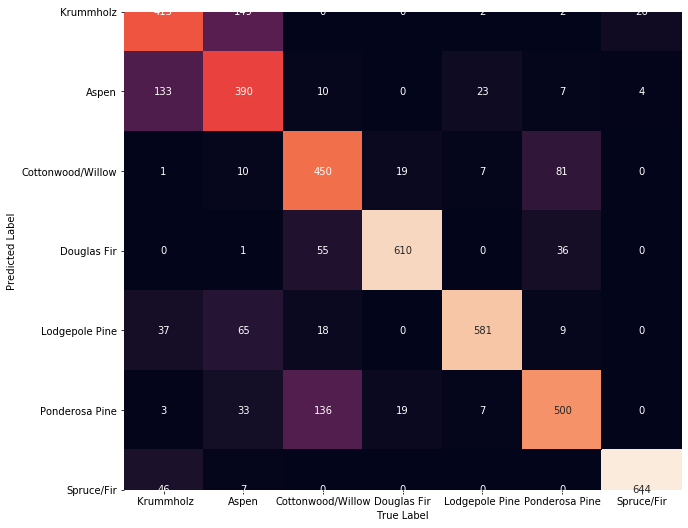

In [59]:
y_labels=train_df['Cover_Type']
y_labels.replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)

mat = confusion_matrix(y_valid, y_predict)
plt.figure(figsize=(10,10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=np.unique(y_labels),
            yticklabels=np.unique(y_labels))
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.show()

## Enhanced Baseline Model

In [60]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

In [61]:
train_old = pd.read_csv('input/train.csv', index_col='Id')
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


def ml_pipleline(ml_name, model, binarize = False,    detailedCVcharts = False):

    label_classes=[1,2,3,4,5,6,7]
    y_binarized = label_binarize(y,classes=[1,2,3,4,5,6,7])
    
    X_train, X_valid, y_train, y_valid = train_test_split(
            X, y, test_size=0.3, random_state=17)
    ml_pipe = Pipeline([('scaler', StandardScaler()), 
                           (ml_name, model)]) 

    ml_pipe.fit(X_train, y_train)

    y_predict = ml_pipe.predict(X_valid)
    report = classification_report(y_predict, y_valid)
  
    print(color.BOLD, ml_name, color.END, '\n')
    print('Metrics: \n ', report)

    cv_scores = cross_val_score(model, X_train, y_train, cv=10)
#     print('Cross Validation Scores:', cv_scores)
    print('\n Cross Validation Average Score', np.mean(cv_scores))
    

    if detailedCVcharts:
        display_CrossValidation_class_level_charts(y_valid, y_predict,label_classes)
        
    return(report, y_predict, y_valid)


knn_classifier = KNeighborsClassifier(n_neighbors=value)
report, y_predict , y_valid= ml_pipleline('KNN with '+ str(value) +'  Neighbors', knn_classifier, \
                                  binarize = False, detailedCVcharts = False )

 KNN with 1  Neighbors  

Metrics: 
                precision    recall  f1-score   support

           1       0.70      0.72      0.71       618
           2       0.62      0.71      0.67       573
           3       0.74      0.85      0.79       580
           4       0.96      0.89      0.92       700
           5       0.95      0.85      0.90       691
           6       0.83      0.78      0.80       682
           7       0.95      0.93      0.94       692

    accuracy                           0.82      4536
   macro avg       0.82      0.82      0.82      4536
weighted avg       0.83      0.82      0.83      4536


 Cross Validation Average Score 0.8102741131907439


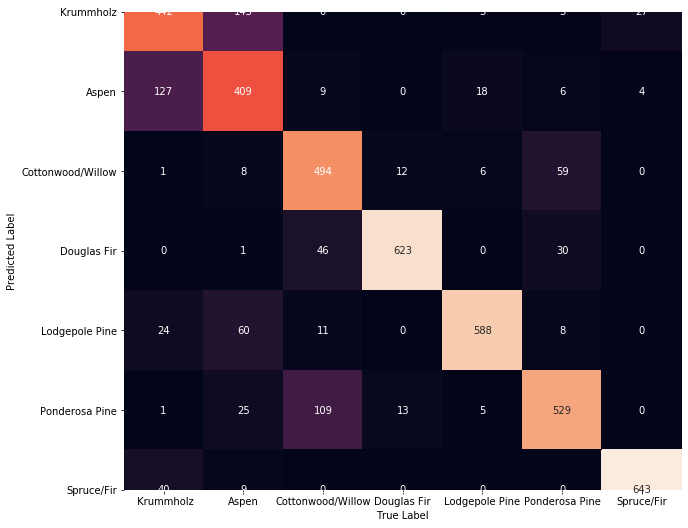

In [62]:
y_labels=train_df['Cover_Type']
y_labels.replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)

mat = confusion_matrix(y_valid, y_predict)
plt.figure(figsize=(10,10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=np.unique(y_labels),
            yticklabels=np.unique(y_labels))
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.show()

## Random Forest

In [63]:
train_old = pd.read_csv('input/train.csv', index_col='Id')
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_old.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)

print("Feature space hold %d observations and %d features" % X.shape)
print("Unique target labels:", np.unique(y))

def ml_pipleline(ml_name, model, binarize = False,    detailedCVcharts = False):

    label_classes=[1,2,3,4,5,6,7]
    y_binarized = label_binarize(y,classes=[1,2,3,4,5,6,7])
    
    X_train, X_valid, y_train, y_valid = train_test_split(
            X, y, test_size=0.3, random_state=17)
    ml_pipe = Pipeline([('scaler', StandardScaler()), 
                           (ml_name, model)]) 

    ml_pipe.fit(X_train, y_train)

    y_predict = ml_pipe.predict(X_valid)
    report = classification_report(y_predict, y_valid)
  
    print(color.BOLD, ml_name, color.END, '\n')
    print('Metrics: \n ', report)

    cv_scores = cross_val_score(model, X_train, y_train, cv=10)
#     print('Cross Validation Scores:', cv_scores)
    print('\n Cross Validation Average Score', np.mean(cv_scores))
    

    if detailedCVcharts:
        display_CrossValidation_class_level_charts(y_valid, y_predict,label_classes)
        
    return(report, y_predict, y_valid)



RFClassifier = RandomForestClassifier(n_estimators=20, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

Feature space hold 15120 observations and 54 features
Unique target labels: [1 2 3 4 5 6 7]
 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.76      0.72      0.74       669
           2       0.64      0.76      0.69       554
           3       0.79      0.84      0.81       624
           4       0.97      0.92      0.94       683
           5       0.93      0.89      0.91       650
           6       0.86      0.81      0.83       676
           7       0.95      0.94      0.95       680

    accuracy                           0.84      4536
   macro avg       0.84      0.84      0.84      4536
weighted avg       0.85      0.84      0.84      4536


 Cross Validation Average Score 0.8396558402584079


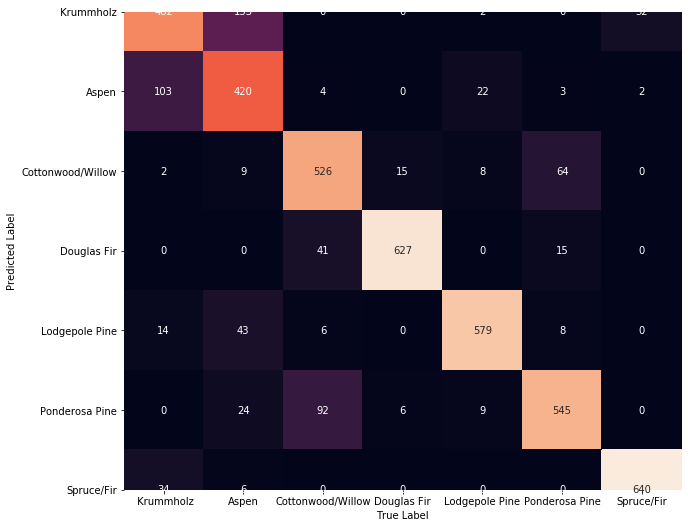

In [64]:
y_labels=train_df['Cover_Type']
y_labels.replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)

mat = confusion_matrix(y_valid, y_predict)
plt.figure(figsize=(10,10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=np.unique(y_labels),
            yticklabels=np.unique(y_labels))
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.show()

In [65]:
train_old = pd.read_csv('input/train.csv', index_col='Id')
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


def ml_pipleline(ml_name, model, binarize = False,    detailedCVcharts = False):

    label_classes=[1,2,3,4,5,6,7]
    y_binarized = label_binarize(y,classes=[1,2,3,4,5,6,7])
    
    X_train, X_valid, y_train, y_valid = train_test_split(
            X, y, test_size=0.3, random_state=17)
    ml_pipe = Pipeline([('scaler', StandardScaler()), 
                           (ml_name, model)]) 

    ml_pipe.fit(X_train, y_train)

    y_predict = ml_pipe.predict(X_valid)
    report = classification_report(y_predict, y_valid)
  
    print(color.BOLD, ml_name, color.END, '\n')
    print('Metrics: \n ', report)

    cv_scores = cross_val_score(model, X_train, y_train, cv=10)
#     print('Cross Validation Scores:', cv_scores)
    print('\n Cross Validation Average Score', np.mean(cv_scores))
    

    if detailedCVcharts:
        display_CrossValidation_class_level_charts(y_valid, y_predict,label_classes)
        
    return(report, y_predict, y_valid)

In [66]:
RFClassifier = RandomForestClassifier(n_estimators=20, random_state=17)
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.79      0.75      0.77       664
           2       0.68      0.80      0.73       556
           3       0.83      0.89      0.86       630
           4       0.98      0.95      0.96       673
           5       0.97      0.90      0.94       667
           6       0.90      0.86      0.88       661
           7       0.96      0.95      0.96       685

    accuracy                           0.87      4536
   macro avg       0.87      0.87      0.87      4536
weighted avg       0.88      0.87      0.87      4536


 Cross Validation Average Score 0.8658341525347429


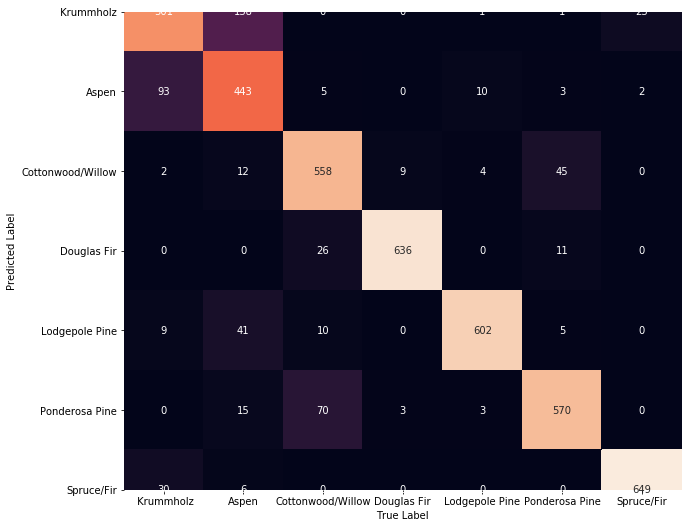

In [67]:
y_labels=train_df['Cover_Type']
y_labels.replace({1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}, inplace=True)

mat = confusion_matrix(y_valid, y_predict)
plt.figure(figsize=(10,10))
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=np.unique(y_labels),
            yticklabels=np.unique(y_labels))
plt.xlabel('True Label')
plt.ylabel('Predicted Label')
plt.show()

In [68]:
#Soil type categorical
RFClassifier = RandomForestClassifier(n_estimators=100, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.80      0.78      0.79       649
           2       0.70      0.81      0.75       570
           3       0.85      0.91      0.88       623
           4       0.99      0.94      0.97       679
           5       0.97      0.90      0.94       667
           6       0.91      0.87      0.89       666
           7       0.97      0.96      0.96       682

    accuracy                           0.88      4536
   macro avg       0.88      0.88      0.88      4536
weighted avg       0.89      0.88      0.89      4536


 Cross Validation Average Score 0.8780172880509929


In [69]:
#Soil type categorical
n_list = [10, 50, 100, 300, 500, 1000, 2000]
for n in n_list:
    RFClassifier = RandomForestClassifier(n_estimators=n, random_state=17)    
    report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.79      0.74      0.77       678
           2       0.66      0.79      0.72       548
           3       0.85      0.85      0.85       665
           4       0.97      0.95      0.96       662
           5       0.96      0.89      0.93       670
           6       0.86      0.87      0.86       630
           7       0.96      0.95      0.96       683

    accuracy                           0.87      4536
   macro avg       0.87      0.86      0.86      4536
weighted avg       0.87      0.87      0.87      4536


 Cross Validation Average Score 0.8552497858836029
 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.79      0.77      0.78       652
           2       0.69      0.80      0.74       568
           3       0.84      0.89      0.87       631
           4       0.99      0.95      0.97       675
           5       0

In [70]:
for depth in [10, 50, 100, 1000, None]:
    RFClassifier = RandomForestClassifier(n_estimators=500, max_depth =depth, random_state=17)    
    report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.75      0.72      0.74       662
           2       0.62      0.76      0.69       536
           3       0.79      0.82      0.80       646
           4       0.98      0.93      0.95       685
           5       0.92      0.86      0.89       661
           6       0.83      0.79      0.81       663
           7       0.94      0.93      0.93       683

    accuracy                           0.83      4536
   macro avg       0.83      0.83      0.83      4536
weighted avg       0.84      0.83      0.84      4536


 Cross Validation Average Score 0.8182216891769591
 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.79      0.77      0.78       646
           2       0.70      0.80      0.75       572
           3       0.84      0.91      0.87       617
           4       0.99      0.94      0.96       685
           5       0

In [71]:
RFClassifier = RandomForestClassifier(n_estimators=500, max_depth =60, bootstrap = True, random_state=17)    
report, y_predict , y_valid= ml_pipleline("Random Forest", RFClassifier, binarize = False, detailedCVcharts = False )

 Random Forest  

Metrics: 
                precision    recall  f1-score   support

           1       0.79      0.77      0.78       646
           2       0.70      0.80      0.75       572
           3       0.84      0.91      0.87       617
           4       0.99      0.94      0.96       685
           5       0.97      0.91      0.94       667
           6       0.91      0.86      0.89       672
           7       0.96      0.96      0.96       677

    accuracy                           0.88      4536
   macro avg       0.88      0.88      0.88      4536
weighted avg       0.89      0.88      0.88      4536


 Cross Validation Average Score 0.8785894901192155


In [74]:
X_train, X_valid, y_train, y_valid = train_test_split(
        X, y, test_size=0.3, random_state=17)
rf_parameters = [{'n_estimators': [500,1000,1500], 
                   'criterion': ["gini", "entropy"],
                   'max_depth':  [3, 5, 9, None],
                   'bootstrap': [True],
                   'oob_score': [True, False],
                   'random_state': [17]
                  
                  }] 
             
rf = GridSearchCV(RandomForestClassifier(), rf_parameters, cv=5, verbose=2)
rf.fit(X_train, y_train)    
rf.best_params_
means=rf.cv_results_['mean_test_score']
stds=rf.cv_results_['std_test_score']

print(rf.best_params_)
print(means)
print(stds)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17, total=   6.6s
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.5s remaining:    0.0s


[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17, total=   5.8s
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17, total=   4.2s
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17, total=   4.7s
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=True, random_state=17, total=   4.1s
[CV] bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=3, n_estimators=500, oob_score=False, random_state=17, total=   3.6s
[CV] bootstrap

[CV]  bootstrap=True, criterion=gini, max_depth=5, n_estimators=500, oob_score=False, random_state=17, total=   4.4s
[CV] bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17, total=  10.8s
[CV] bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17, total=  10.9s
[CV] bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17, total=  11.9s
[CV] bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=5, n_estimators=1000, oob_score=True, random_state=17, total=  11.1s
[CV] bo

[CV]  bootstrap=True, criterion=gini, max_depth=9, n_estimators=1000, oob_score=False, random_state=17, total=  16.1s
[CV] bootstrap=True, criterion=gini, max_depth=9, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=9, n_estimators=1000, oob_score=False, random_state=17, total=  13.8s
[CV] bootstrap=True, criterion=gini, max_depth=9, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=9, n_estimators=1000, oob_score=False, random_state=17, total=  13.2s
[CV] bootstrap=True, criterion=gini, max_depth=9, n_estimators=1500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=9, n_estimators=1500, oob_score=True, random_state=17, total=  27.6s
[CV] bootstrap=True, criterion=gini, max_depth=9, n_estimators=1500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=9, n_estimators=1500, oob_score=True, random_state=17, total=  25.6s
[C

[CV]  bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=True, random_state=17, total=  36.3s
[CV] bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17, total=  30.8s
[CV] bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17, total=  30.2s
[CV] bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17, total=  37.1s
[CV] bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=gini, max_depth=None, n_estimators=1500, oob_score=False, ran

[CV]  bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17, total=   8.0s
[CV] bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17, total=   7.4s
[CV] bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17, total=   7.5s
[CV] bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=True, random_state=17, total=   8.6s
[CV] bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=5, n_estimators=500, oob_score=False, random_state=17, t

[CV]  bootstrap=True, criterion=entropy, max_depth=9, n_estimators=500, oob_score=False, random_state=17, total=  12.2s
[CV] bootstrap=True, criterion=entropy, max_depth=9, n_estimators=500, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, n_estimators=500, oob_score=False, random_state=17, total=  10.6s
[CV] bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_state=17, total=  25.1s
[CV] bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_state=17, total=  25.5s
[CV] bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=9, n_estimators=1000, oob_score=True, random_stat

[CV]  bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=True, random_state=17, total=  30.1s
[CV] bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17, total=  27.5s
[CV] bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17, total=  27.6s
[CV] bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17, total=  31.4s
[CV] bootstrap=True, criterion=entropy, max_depth=None, n_estimators=1000, oob_score=False, random_state=17 
[CV]  bootstrap=True, criterion=entropy, max_depth=None, n_estimators

[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed: 70.2min finished


{'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'n_estimators': 1500, 'oob_score': True, 'random_state': 17}
[0.65561224 0.65561224 0.65513983 0.65513983 0.65721844 0.65721844
 0.70880574 0.70880574 0.71041194 0.71041194 0.7101285  0.7101285
 0.79355631 0.79355631 0.7941232  0.7941232  0.79365079 0.79365079
 0.87282691 0.87282691 0.87282691 0.87282691 0.87226002 0.87226002
 0.662226   0.662226   0.66392668 0.66392668 0.66194255 0.66194255
 0.70984505 0.70984505 0.70975057 0.70975057 0.70833333 0.70833333
 0.80432729 0.80432729 0.80536659 0.80536659 0.80404384 0.80404384
 0.87414966 0.87414966 0.8739607  0.8739607  0.87424414 0.87424414]
[0.00633066 0.00633066 0.00620806 0.00620806 0.00542248 0.00542248
 0.0041347  0.0041347  0.00514471 0.00514471 0.00561409 0.00561409
 0.0046964  0.0046964  0.00355861 0.00355861 0.00364132 0.00364132
 0.00545229 0.00545229 0.00620101 0.00620101 0.00637363 0.00637363
 0.00494586 0.00494586 0.0074679  0.0074679  0.00685847 0.00685847
 0.00

## SVM

In [75]:
from sklearn.svm import SVC

train_old = pd.read_csv('input/train.csv', index_col='Id')
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_old.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.3, random_state=17)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

svm_parameters = [{'kernel': ['rbf'], 'gamma': [0.0001, 0.001],'C': [1, 5, 10, 50]}] 

#svm_parameters = [{'kernel': ['rbf'], 'C': [1,10,100]}]                
clf = GridSearchCV(SVC(), svm_parameters, cv=10, verbose=2)
clf.fit(X_train, y_train)    
clf.best_params_
means=clf.cv_results_['mean_test_score']
stds=clf.cv_results_['std_test_score']

print(clf.best_params_)
print(means)
print(stds)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
[CV] C=1, gamma=0.0001, kernel=rbf ...................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  12.5s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.4s remaining:    0.0s


[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  12.7s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  11.4s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  13.2s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  12.7s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  11.9s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  12.0s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  11.5s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .

[CV] .................... C=10, gamma=0.001, kernel=rbf, total=   4.5s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   4.9s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   4.4s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   4.8s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   5.1s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   5.4s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   4.4s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] .

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  8.5min finished


{'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
[0.60714286 0.62140967 0.61205593 0.66780045 0.62065382 0.68764172
 0.6648715  0.72987528]
[0.01210959 0.01216064 0.01175688 0.01410332 0.01229095 0.01491538
 0.01336759 0.01033953]


In [76]:
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.3, random_state=17)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

svm_parameters = [{'kernel': ['rbf'], 'gamma': [0.0001, 0.001],'C': [1, 5, 10, 50]}] 

#svm_parameters = [{'kernel': ['rbf'], 'C': [1,10,100]}]                
clf = GridSearchCV(SVC(), svm_parameters, cv=10, verbose=2)
clf.fit(X_train, y_train)    
clf.best_params_
means=clf.cv_results_['mean_test_score']
stds=clf.cv_results_['std_test_score']

print(clf.best_params_)
print(means)
print(stds)

Fitting 10 folds for each of 8 candidates, totalling 80 fits
[CV] C=1, gamma=0.0001, kernel=rbf ...................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  17.7s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   17.6s remaining:    0.0s


[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  16.5s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  16.5s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  16.7s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  16.9s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  17.7s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  20.3s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .................... C=1, gamma=0.0001, kernel=rbf, total=  17.8s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] .

[CV] .................... C=10, gamma=0.001, kernel=rbf, total=   8.9s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   7.6s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   7.5s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   7.5s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   9.1s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   7.3s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=50, gamma=0.0001, kernel=rbf, total=   7.8s
[CV] C=50, gamma=0.0001, kernel=rbf ..................................
[CV] .

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 13.1min finished


{'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}
[0.59476568 0.6393613  0.62037037 0.7010582  0.64143991 0.71986017
 0.68877551 0.74820484]
[0.01385596 0.01340305 0.01087764 0.01033984 0.01430539 0.0091114
 0.01075801 0.009947  ]


## XGBoost

In [77]:
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_old.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

# y_train = encoder.fit_transform(y_train)
# y_valid = encoder.fit_transform(y_valid)

#     else:
#     X_train, X_valid, y_train, y_valid = train_test_split(
#         X, y, test_size=0.3, random_state=17)
scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [78]:
from xgboost import XGBClassifier

# This produces 0.86 accuracy
# xgb0 = XGBClassifier(
#     objective= 'multi:softprob',
#      learning_rate =0.1,
#      n_estimators=1000,
#      max_depth=5,
#      min_child_weight=1,
#      gamma=0,
#      subsample=0.8,
#      colsample_bytree=0.8,
#      nthread=4,
#      scale_pos_weight=1,
#      seed=27
    
import xgboost as xgb
xgb0 = XGBClassifier(
    objective= 'multi:softprob',
     learning_rate =0.2,
     n_estimators=1000,
     max_depth=9,
     min_child_weight=1,
     gamma=0,
     subsample=0.8,
     colsample_bytree=0.6,
     nthread=4,
     scale_pos_weight=1,
     seed=27,
     eval_metric = ["merror", "map", "auc"],
     reg_alpha=0.005    
)
#     tree_method = "approx", 

xgb0.fit(X_train, y_train,
         verbose=100,
#          early_stopping_rounds=3,
         eval_metric=["auc", "mlogloss"]
        )

y_predict = xgb0.predict(X_valid)
report = classification_report(y_predict, y_valid)
print(report)
print(" ")
cv_scores = cross_val_score(xgb0, X_train, y_train, cv=10)
print('\n Cross Validation Average Score', np.mean(cv_scores))

[08:38:24] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


              precision    recall  f1-score   support

           1       0.74      0.75      0.74       625
           2       0.67      0.75      0.71       593
           3       0.83      0.88      0.85       630
           4       0.98      0.94      0.96       672
           5       0.96      0.89      0.92       667
           6       0.88      0.85      0.86       657
           7       0.96      0.93      0.95       692

    accuracy                           0.86      4536
   macro avg       0.86      0.86      0.86      4536
weighted avg       0.86      0.86      0.86      4536

 
[08:40:

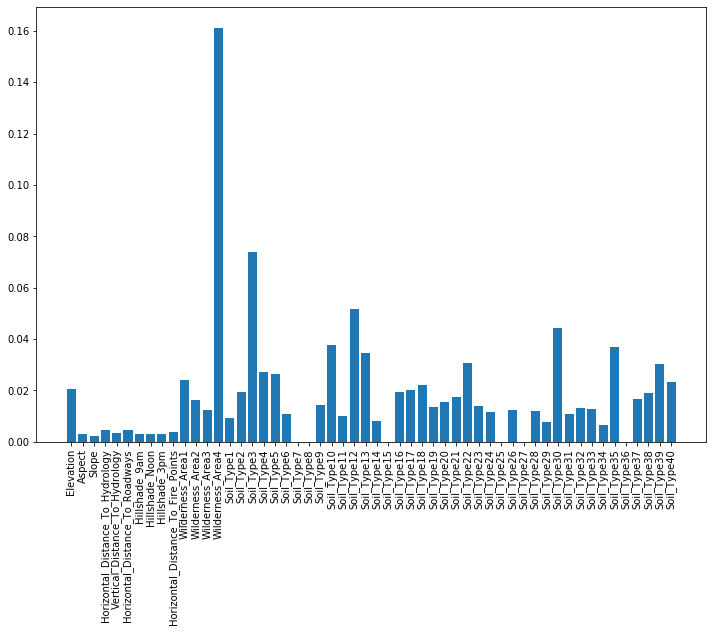

In [79]:
# plot
target = "Cover_Type"
predictors = [x for x in train_old.columns if x not in [target]]
plt.figure(figsize=(12,8))
plt.bar(predictors,xgb0.feature_importances_ )
plt.xticks(predictors, predictors, rotation='vertical')
plt.show()


In [80]:
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

# y_train = encoder.fit_transform(y_train)
# y_valid = encoder.fit_transform(y_valid)

#     else:
#     X_train, X_valid, y_train, y_valid = train_test_split(
#         X, y, test_size=0.3, random_state=17)
scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [88]:
from xgboost import XGBClassifier

def perform_xgb(X_train, y_train, X_valid, y_valid, predictors):
    import xgboost as xgb
    xgb0 = XGBClassifier(
        objective= 'multi:softprob',
         learning_rate =0.1,
         n_estimators=1000,
         max_depth=9,
         min_child_weight=1,
         gamma=0,
         subsample=0.8,
         colsample_bytree=0.8,
         nthread=4,
         scale_pos_weight=1,
         seed=27,
         eval_metric = ["merror", "map", "auc"],
         reg_alpha=0.005    
    )
    #     tree_method = "approx", 

    xgb0.fit(X_train, y_train,
             verbose=100,
    #          early_stopping_rounds=3,
             eval_metric=["auc", "mlogloss"]
            )

    y_predict = xgb0.predict(X_valid)
    report = classification_report(y_predict, y_valid)
    print(report)
    print(" ")
    cv_scores = cross_val_score(xgb0, X_train, y_train, cv=10)
    print('\n Cross Validation Average Score', np.mean(cv_scores))
    
    # plot
    plt.figure(figsize=(12,8))
    plt.bar(predictors,xgb0.feature_importances_ )
    plt.xticks(predictors, predictors, rotation='vertical')
    plt.show()
    
    return(xgb0, y_predict)


[08:55:32] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


              precision    recall  f1-score   support

           1       0.78      0.79      0.79       633
           2       0.71      0.80      0.75       586
           3       0.86      0.91      0.88       628
           4       0.98      0.94      0.96       670
           5       0.98      0.91      0.94       663
           6       0.92      0.88      0.90       669
           7       0.97      0.95      0.96       687

    accuracy                           0.89      4536
   macro avg       0.89      0.88      0.88      4536
weighted avg       0.89      0.89      0.89      4536

 
[09:01:

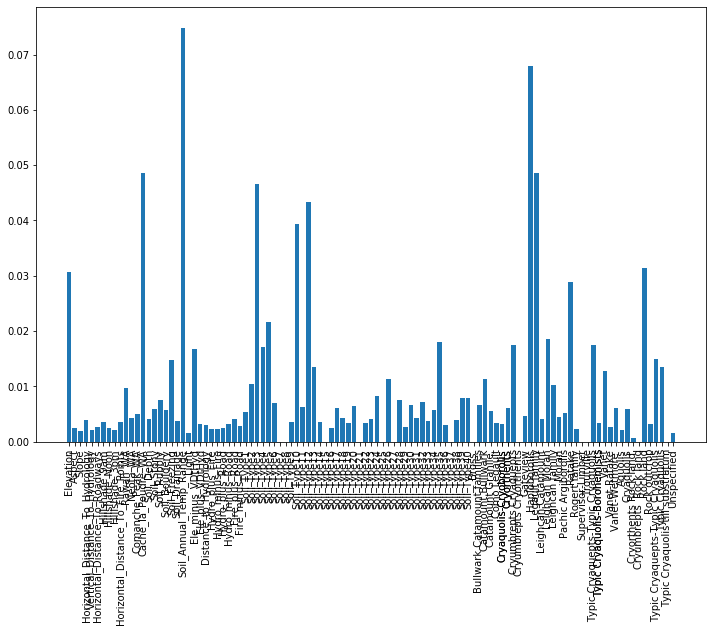

array([1, 4, 5, ..., 7, 7, 5], dtype=int64)

In [82]:
predictors = [x for x in cover_feat_space.columns if x not in [target]]
perform_xgb(X_train, y_train, X_valid, y_valid, predictors)

##### Collapsing Soil Type

In [83]:
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

[09:45:31] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


              precision    recall  f1-score   support

           1       0.78      0.78      0.78       633
           2       0.71      0.80      0.75       586
           3       0.86      0.90      0.88       636
           4       0.98      0.95      0.96       668
           5       0.97      0.91      0.94       660
           6       0.91      0.88      0.89       664
           7       0.97      0.95      0.96       689

    accuracy                           0.88      4536
   macro avg       0.88      0.88      0.88      4536
weighted avg       0.89      0.88      0.88      4536

 
[09:48:

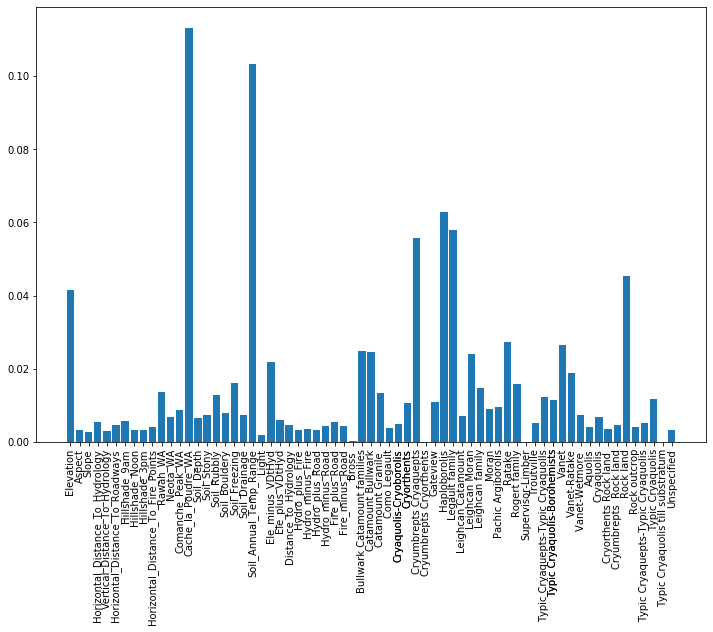

array([1, 4, 5, ..., 7, 7, 5], dtype=int64)

In [84]:
predictors = [x for x in cover_feat_space.columns if x not in [target]]
perform_xgb(X_train, y_train, X_valid, y_valid, predictors)

## Neural networks

In [85]:

# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
to_drop = ['Cover_Type']
cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y_binarized, test_size=0.3, random_state=17)

# y_train = encoder.fit_transform(y_train)
# y_valid = encoder.fit_transform(y_valid)

#     else:
#     X_train, X_valid, y_train, y_valid = train_test_split(
#         X, y, test_size=0.3, random_state=17)
scaler = StandardScaler()
scalar = scaler.fit(X_train)
X_std_train = scaler.transform(X_train)
X_std_valid =  scaler.transform(X_valid)

In [86]:
import time

from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D


## Model - New activation
model = Sequential() 
model.add(Dense(units=50, input_dim=71, activation='relu')) 
model.add(Dense(units=7, input_dim=50, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

ValueError: in user code:

    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:571 train_function  *
        outputs = self.distribute_strategy.run(
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:951 run  **
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2290 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2649 _call_for_each_replica
        return fn(*args, **kwargs)
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:531 train_step  **
        y_pred = self(x, training=True)
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\base_layer.py:886 __call__
        self.name)
    C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\input_spec.py:216 assert_input_compatibility
        ' but received input with shape ' + str(shape))

    ValueError: Input 0 of layer sequential is incompatible with the layer: expected axis -1 of input shape to have value 71 but received input with shape [None, 110]


In [ ]:
## Model - New activation
model = Sequential() 
model.add(Dense(units=30, input_dim=71, activation='relu')) 
model.add(Dense(units=7, input_dim=30, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

In [ ]:
## Model - New activation
model = Sequential() 
model.add(Dense(units=30, input_dim=71, activation='sigmoid')) 
model.add(Dense(units=7, input_dim=30, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

In [ ]:
## Model - New activation
model = Sequential() 
model.add(Dense(units=50, input_dim=71, activation='relu')) 
model.add(Dense(units=30, input_dim=50, activation='softmax')) 
model.add(Dense(units=10, input_dim=30, activation='softmax')) 
model.add(Dense(units=7, input_dim=10, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

In [ ]:
model = Sequential() 
model.add(Dense(units=60, input_dim=71, activation='relu')) 
model.add(Dense(units=50, input_dim=60, activation='softmax')) 
model.add(Dense(units=40, input_dim=50, activation='softmax')) 
model.add(Dense(units=30, input_dim=40, activation='softmax')) 
model.add(Dense(units=20, input_dim=30, activation='softmax'))
model.add(Dense(units=10, input_dim=20, activation='softmax'))
model.add(Dense(units=7, input_dim=10, activation='softmax')) 

## Cost function & Objective (and solver)
sgd = optimizers.SGD(lr=0.01)
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_std_train, y_train, shuffle=True, batch_size=10,verbose=0, epochs=100) 
score = model.evaluate(X_std_valid, y_valid, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

### Best Model and Results

[10:39:33] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


              precision    recall  f1-score   support

           1       0.78      0.78      0.78       633
           2       0.71      0.80      0.75       586
           3       0.86      0.90      0.88       636
           4       0.98      0.95      0.96       668
           5       0.97      0.91      0.94       660
           6       0.91      0.88      0.89       664
           7       0.97      0.95      0.96       689

    accuracy                           0.88      4536
   macro avg       0.88      0.88      0.88      4536
weighted avg       0.89      0.88      0.88      4536

 
[10:43:

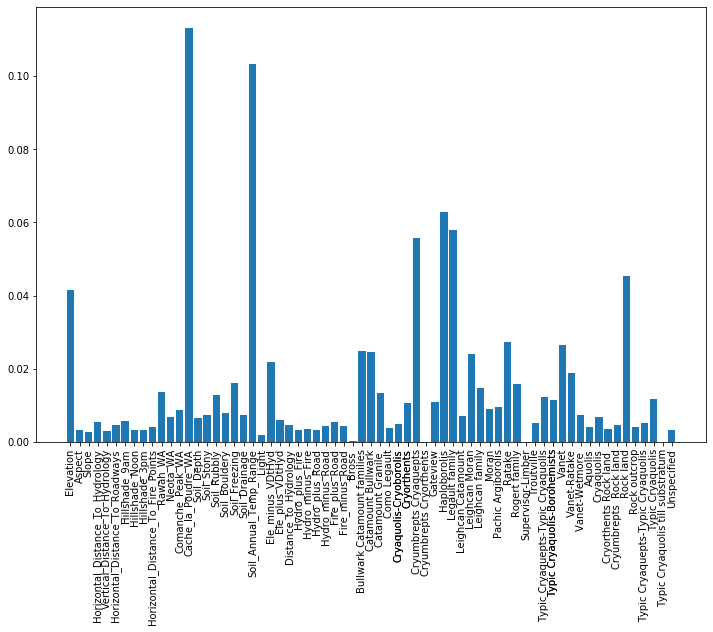

In [89]:
# Isolate target data
cover_type = train_old['Cover_Type']
y = np.array(cover_type)

# Dropping output from feature space
# to_drop = ['Cover_Type']
to_drop = ['Cover_Type','Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40']



cover_feat_space = train_new.drop(to_drop, axis = 1)

# Pull out geatures for future use
features = cover_feat_space.columns
X = np.array(cover_feat_space).astype(np.float)


label_classes = [1,2,3,4,5,6,7]
y_binarized = label_binarize(y, classes=[1,2,3,4,5,6,7])
# encoder = preprocessing.LabelEncoder()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.3, random_state=17)

predictors = [x for x in cover_feat_space.columns if x not in [target]]
xgb, y_predict = perform_xgb(X_train, y_train, X_valid, y_valid, predictors)

### Writing results to a file for submission

In [258]:

test_df = pd.read_csv('input/test.csv', index_col='Id')
test_df= add_soil_type(test_df)
test_df= add_soil_family(test_df)
test_df= add_Soil_Complex(test_df)
test_df= add_Soil_depth(test_df)
test_df= add_Soil_Stony(test_df)
test_df= add_Soil_Rubbly(test_df)
test_df= add_Soil_Bouldery(test_df)
test_df= add_Soil_Freezing(test_df)
test_df= add_Soil_Drainage(test_df)
test_df= add_Soil_Annual_Temp_Range(test_df)
test_df = add_light(test_df)
test_df = rename_wilderness_area(test_df)
test_df= add_more_features(test_df)
test_new = prepare_for_ML_Program(test_df, test=True)
# test_new.columns

# Feature 'Gothic' is not available in Train data
to_drop = ['Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type7','Soil_Type8',
          'Soil_Type9','Soil_Type10','Soil_Type11','Soil_Type12','Soil_Type13','Soil_Type14','Soil_Type15','Soil_Type16','Soil_Type17',
          'Soil_Type18','Soil_Type19','Soil_Type20','Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type26',
          'Soil_Type27','Soil_Type28','Soil_Type29','Soil_Type30','Soil_Type31','Soil_Type32','Soil_Type33','Soil_Type34','Soil_Type35','Soil_Type26',
          'Soil_Type36','Soil_Type37','Soil_Type38','Soil_Type39', 'Soil_Type40', 'Gothic']



cover_feat_space = test_new.drop(to_drop, axis = 1)



# # Pull out features for future use
features = cover_feat_space.columns
# list(features)
X_test = np.array(cover_feat_space).astype(np.float)

y_test_predict  = xgb.predict(X_test)


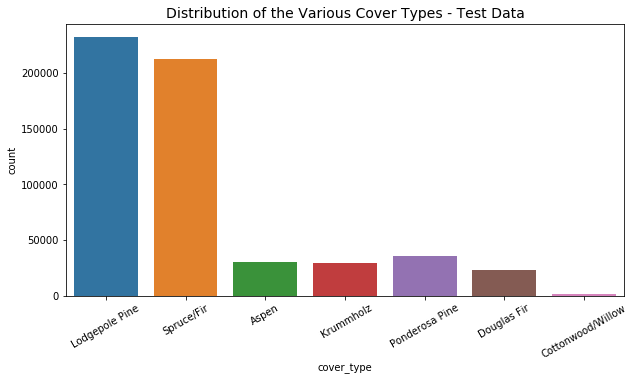

In [277]:
X_ids = pd.DataFrame(test_df.index, columns =['Id'])
# Results
cover_types_dict = {1:'Spruce/Fir', 2: 'Lodgepole Pine', 3: 'Ponderosa Pine', 4: 'Cottonwood/Willow', 5: 'Aspen', 6: 'Douglas Fir', 7: ' Krummholz'}
y_test_labels = pd.DataFrame([cover_types_dict[value] for value in y_test_predict], columns =['cover_type'])
results = pd.concat([X_ids,y_test_labels], axis=1 )   

fig, ax = plt.subplots(figsize=(10,5))
ax.set_title("Distribution of the Various Cover Types - Test Data", size = 14)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
ax = sns.countplot(x = "cover_type", data = results)


In [280]:
y_test_results = pd.DataFrame(y_test_predict,columns=['cover_type'])
final_results = pd.concat([X_ids,y_test_results], axis=1 )
final_results.to_csv('TestResults.csv')
